# Automating stem cell count

In [1]:
# --------- Mounting Drive and Installing Packages ---------

# Are we using Colab?
try:
  import google.colab
  IN_COLAB = True
except:
  IN_COLAB = False

# If so, connect to Google account and install needed packages
if IN_COLAB:
    # We mount the drive
    from google.colab import drive
    drive.mount('/content/drive')
    ! ls drive/MyDrive/datasets/

    # We install the packages
    ! pip install czifile
    ! python -m pip install "napari[all]"
    ! python -m pip install -U scikit-image
    ! pip install pyclesperanto-prototype
    ! pip install lxml
    ! pip install stardist


In [2]:
# --------- Imports ---------

# General Imports
import os
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch, Circle
from matplotlib.colors import LogNorm
from matplotlib.lines import Line2D

# Opening Images Imports
import czifile
from pathlib import Path
from lxml import etree


# Visualizing Images Imports
import napari
from napari.utils import nbscreenshot


# Filtering Images Imports
import skimage
import skimage.draw
from skimage import morphology
from skimage import img_as_float
from skimage import exposure
from skimage import filters
from skimage.morphology import reconstruction, disk, white_tophat, square, opening
from skimage.restoration import rolling_ball, denoise_bilateral
from skimage.filters import threshold_otsu
from skimage.measure import regionprops, regionprops_table

from scipy.ndimage import gaussian_filter
from pyclesperanto_prototype import imshow


# Image Segmentation Imports
from stardist.models import StarDist2D
from skimage.segmentation import find_boundaries

# Teselation Imports
from scipy.spatial import Voronoi, voronoi_plot_2d, distance

# Clustering Imports
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture

# Bounds for coloring the regions
from shapely.geometry import Polygon, box, GeometryCollection, Point, MultiPolygon, LineString
from shapely.validation import explain_validity, make_valid




2023-12-26 13:43:35.286223: E tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:9342] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2023-12-26 13:43:35.286270: E tensorflow/compiler/xla/stream_executor/cuda/cuda_fft.cc:609] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2023-12-26 13:43:35.287751: E tensorflow/compiler/xla/stream_executor/cuda/cuda_blas.cc:1518] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2023-12-26 13:43:35.460728: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [3]:
if not IN_COLAB:
  %gui qt

In [4]:
# --------- Opening Images ---------

# Instantiate a Path object
if IN_COLAB:
  czi_file_path = Path(r"drive/MyDrive/datasets/ESTA - Sph1 Z Stack - CTRL SOX2.czi")
else:
  czi_file_path = Path(r"./data/Sph1 Z Stack - CTRL SOX2.czi")

# Read the image and get the CziFile object
with czifile.CziFile(czi_file_path) as czi:
    img = czi.asarray()  # Store image data in 'img' variable
    czi_object = czi  # Store the CziFile object



In [5]:
# I want the name of the czifile as a string
czi_file_name = os.path.basename(czi_file_path)
print(czi_file_name)

Sph1 Z Stack - CTRL SOX2.czi


In [6]:
czi.shape

(1, 1, 3, 1, 9, 2292, 2292, 1)

In [7]:
czi.axes

'BVCTZYX0'

So, according to this, `img` is an array of:
- B = 1, so one block
- V = 1, so one view
- C = 3, so three channels (which makes sense, they are the optic channel, the one indicating the nuclei and the SOX2 channel)
- T = 1, so a single time frame (i.e. no $t$ component)
- Z = 9, so 9 $z$ slices
- Y = 2292, so we have that many pixels in the $y$ direction (height)
- X = 2292, idem (note that we have a square image)
- '0' = 1, indicating that we have a single sample 


I also checked the metadata, and the spacing is the same than with Sph1.
```python
<Scaling>
      <Items>
        <Distance Id="X">
          <Value>1.2364633517553391e-007</Value>
        </Distance>
        <Distance Id="Y">
          <Value>1.2364633517553394e-007</Value>
        </Distance>
        <Distance Id="Z">
          <Value>1.9999999999999999e-006</Value>
        </Distance>
      </Items>
    </Scaling>
```

In [8]:
# --------- Getting rid of the extra dimensions ---------
image_squeezed = np.squeeze(img)
image_squeezed.shape

(3, 9, 2292, 2292)

In [9]:
# --------- Separating the channels ---------

# The first channel is the corresponding to stemness
stemness_channel = image_squeezed[0, :, :, :]
# Channel 2 is the optic one
optic_channel = image_squeezed[1, :, :, :]
# Channel 3 contains the nuclei
nuclei_channel = image_squeezed[2, :, :, :]

In [9]:
#@title Using Napari for Visualization

if not IN_COLAB:
  viewer = napari.Viewer()
  viewer.add_image(nuclei_channel, colormap='blue', blending='additive')
  viewer.add_image(stemness_channel, colormap='red', blending='additive')
  viewer.add_image(optic_channel, colormap='gray', blending='additive')
  print(viewer.layers)
  # We never close the napari window and can take a screenshot whenever we like
  nbscreenshot(viewer)

[<Image layer 'nuclei_channel' at 0x704363fff700>, <Image layer 'stemness_channel' at 0x704363fff8b0>, <Image layer 'optic_channel' at 0x7043605b00d0>]


In [10]:
# Z slice to analyze

z_slice = 3

## Stemness Channel

In [11]:
# --------- Processing the stemness channel ---------

stemness_array = np.copy(stemness_channel)

# Convert to float
stemness_floats_array = img_as_float(stemness_array)

h = 0.5

seed = stemness_floats_array - h
mask = stemness_floats_array

dilated = reconstruction(seed, mask, method='dilation')
hdome = stemness_floats_array - dilated

# Adaptive Equalization
hdome_adapteq = exposure.equalize_adapthist(hdome, clip_limit=0.03)

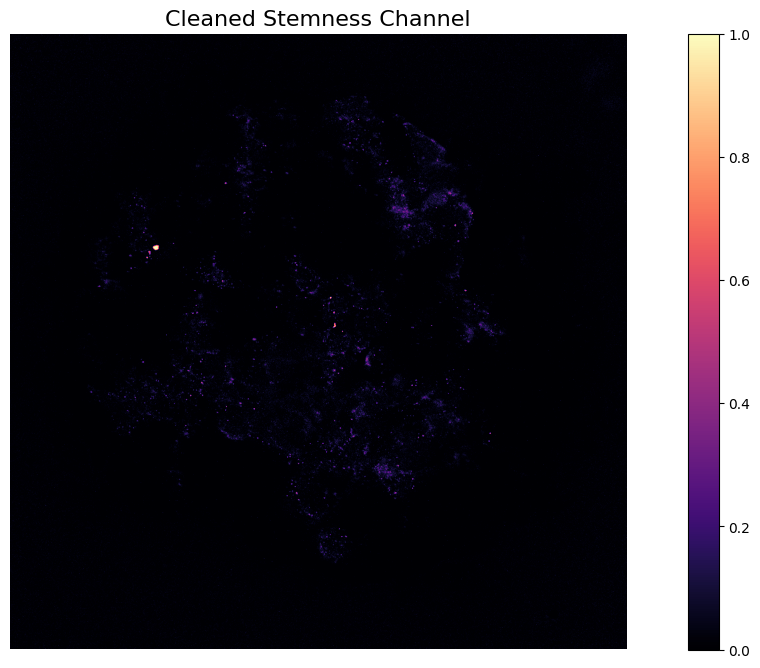

In [12]:
# --------- Visualize the result ---------

fig, ax = plt.subplots(figsize=(16, 8))
ax.imshow(hdome_adapteq[z_slice], cmap='magma')
fig.colorbar(plt.cm.ScalarMappable(norm=None, cmap='magma'), ax=ax)
ax.axis('off')

ax.set_title('Cleaned Stemness Channel', fontsize=16)

# # Saving (Local)
# filename = "/slice_4/sox2_processed.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)




plt.show()  # Display the plot

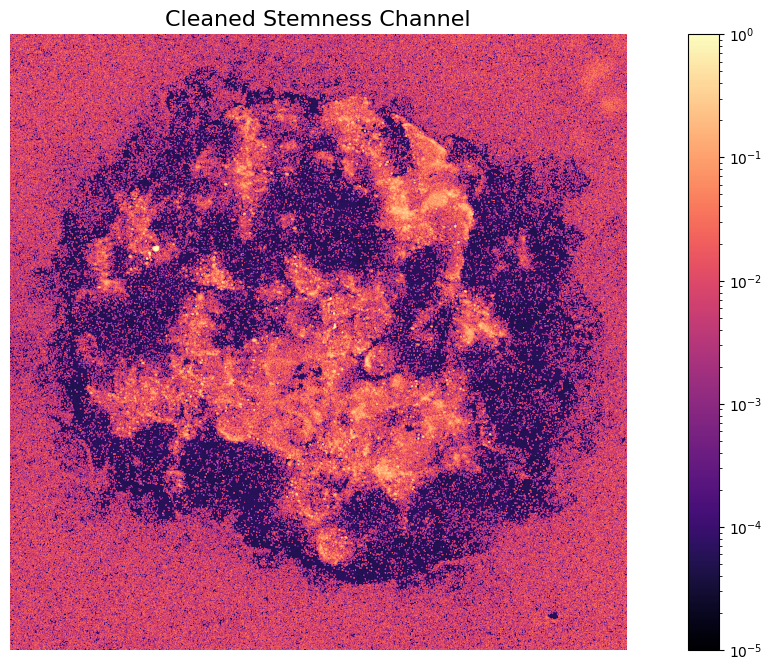

In [13]:
# --------- Visualize the result ---------

fig, ax = plt.subplots(figsize=(16, 8))

norm = LogNorm(vmin=stemness_floats_array[z_slice].min() + 1e-5, vmax=stemness_floats_array[z_slice].max())
cmap = 'magma'

ax.imshow(hdome_adapteq[z_slice], cmap=cmap, norm=norm)
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), ax=ax)
ax.axis('off')

ax.set_title('Cleaned Stemness Channel', fontsize=16)

# # Saving (Local)
# filename = "/slice_4/sox2_processed.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)




plt.show()  # Display the plot

Notar como en la región donde no hay nada, quedó un ruido apreciable, mucho mayor al que quedó luego de la limpieza al rededor de los objetos. Para tratar con esto es que luego uno le corta la cola inferior a la distribución de intensidad de fluorescencia.

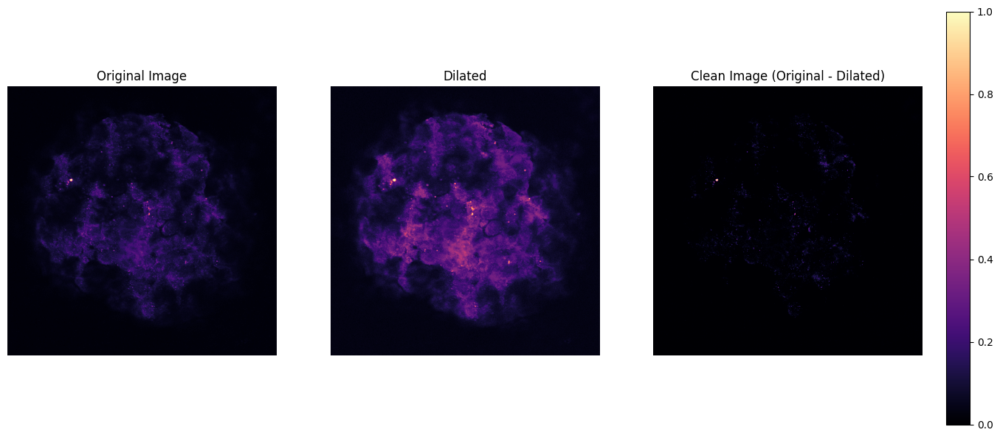

In [14]:
# Your existing code for setting up the figure and axes
fig, (ax0, ax1, ax2) = plt.subplots(nrows=1, ncols=3, figsize=(16, 8))

# First line for linear scale, second line for log scale
norm = None
# norm = LogNorm(vmin=stemness_floats_array[z_slice].min() + 1e-5, vmax=stemness_floats_array[z_slice].max())

# Plot the images with log normalization
# cmap='bwr'
cmap='magma'

ax0.imshow(stemness_floats_array[z_slice], cmap=cmap, norm=norm)
ax0.set_title('Original Image')
ax0.axis('off')

ax1.imshow(dilated[z_slice], cmap=cmap, norm=norm) # , vmin=stemness_floats_array[z_slice].min(), vmax=stemness_floats_array[z_slice].max()
ax1.set_title('Dilated')
ax1.axis('off')

ax2.imshow(hdome[z_slice], cmap=cmap, norm=norm)
ax2.set_title('Clean Image (Original - Dilated)')
ax2.axis('off')

# Add colorbar with log normalization
cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])  # left, bottom, width, height
fig.colorbar(plt.cm.ScalarMappable(norm=norm, cmap=cmap), cax=cbar_ax, orientation='vertical')

# fig.tight_layout(rect=[0, 0, 0.9, 1])  # Adjust the rect parameter to make space for the colorbar

plt.show()

## Nuclei Channel

In [15]:
# 0. Converting the original image to float (originally it's a 'uint16')
image_3d = np.copy(nuclei_channel)
image_2d = image_3d[z_slice]

image_normalized = image_3d.astype(np.float32) / 65535.0

# 1. Adaptive Histogram Equalization on the 3D image
image_3d_equalized = exposure.equalize_adapthist(image_3d)

# 2. Extract a 2D slice from the equalized 3D image
image_2d_equalized = image_3d_equalized[z_slice]

# 3. Morphological opening to remove small noise
selem = morphology.disk(2)  # using a disk-shaped structuring element of radius 2
image_2d_opened = morphology.opening(image_2d_equalized, selem)
image_2d_opened = morphology.area_closing(image_2d_opened, area_threshold=150)

# 4. Bilateral Filtering (denoising without bluring edges)
image_opened_bilateral = denoise_bilateral(image_2d_opened, sigma_color=0.05, sigma_spatial=15)

# 5. Load pretrained StarDist 2D model for fluorescent images
model = StarDist2D.from_pretrained('2D_versatile_fluo')

# Perform instance segmentation on the normalized binary image
labels, details = model.predict_instances(image_opened_bilateral)

# Extract boundaries from the labels
boundaries = find_boundaries(labels)

# ----------------------------------

# Overlay boundaries on the opened, filtered image
overlay = np.copy(image_opened_bilateral)
overlay[boundaries] = np.max(image_opened_bilateral)  # setting the boundary pixels to the maximum value of the image for visualization



Found model '2D_versatile_fluo' for 'StarDist2D'.
Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.479071, nms_thresh=0.3.


2023-12-26 13:59:48.674128: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-12-26 13:59:50.953269: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 679477248 exceeds 10% of free system memory.
2023-12-26 13:59:57.407921: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 169869312 exceeds 10% of free system memory.
2023-12-26 13:59:57.754555: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 169869312 exceeds 10% of free system memory.
2023-12-26 13:59:58.031481: W tensorflow/tsl/framework/cpu_allocator_impl.cc:83] Allocation of 169869312 exceeds 10% of free system memory.


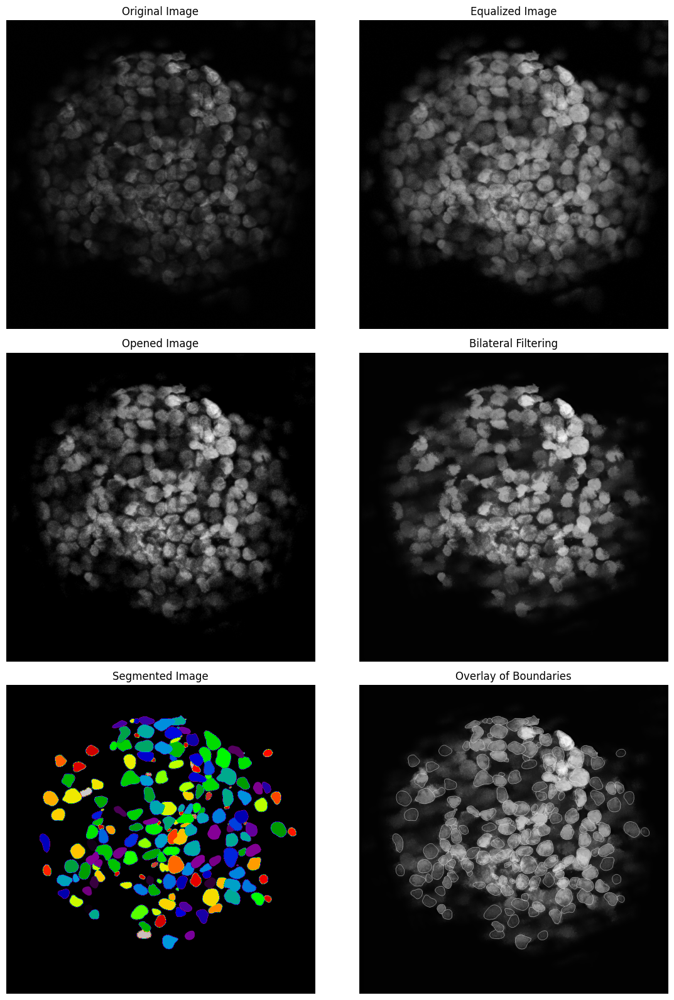

In [17]:
# --------- Visualize the result ---------


# Plotting the original, equalized, opened, and segmented images
fig, axes = plt.subplots(3, 2, figsize=(12, 16))
ax = axes.ravel()

ax[0].imshow(image_2d, cmap='gray')
ax[0].set_title("Original Image")
ax[0].axis('off')

ax[1].imshow(image_2d_equalized, cmap='gray')
ax[1].set_title("Equalized Image")
ax[1].axis('off')

ax[2].imshow(image_2d_opened, cmap='gray')
ax[2].set_title("Opened Image")
ax[2].axis('off')

ax[3].imshow(image_opened_bilateral, cmap='gray')
ax[3].set_title("Bilateral Filtering")
ax[3].axis('off')

ax[4].imshow(labels, cmap='nipy_spectral')
ax[4].set_title("Segmented Image")
ax[4].axis('off')

ax[5].imshow(overlay, cmap='gray')
ax[5].set_title("Overlay of Boundaries")
ax[5].axis('off')

plt.tight_layout()


# # Saving (Local)
# filename = "/slice_4/nuclei_processing.png" # Local path
# plt.savefig(filename)


# # Saving (Colab)
# filename = "/content/sox2_processed.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)
# from google.colab import files
# files.download(filename)



plt.show()

### Generating the DataFrame

In [18]:
# --------- Generation of the DataFrame with geometrical properties of segmented objects ---------

spacing = (1.2364633517553391e-7, 1.2364633517553391e-7)  # in meters for (y, x) dimensions

properties = [
    "label", "area", "centroid", "equivalent_diameter", "bbox_area", "convex_area", "filled_area", "major_axis_length",
    "minor_axis_length", "bbox", "weighted_centroid", "coords",
    "eccentricity", "euler_number", "extent",
    "feret_diameter_max", "max_intensity", "mean_intensity", "min_intensity",
    "orientation", "perimeter", "solidity"
]

# Extract the region properties
regions = regionprops_table(labels, intensity_image=image_opened_bilateral, properties=properties) # , spacing=spacing

# Convert the result to a DataFrame
df = pd.DataFrame(regions)
df


,label,area,centroid-0,centroid-1,equivalent_diameter,bbox_area,convex_area,filled_area,major_axis_length,minor_axis_length,...,eccentricity,euler_number,extent,feret_diameter_max,max_intensity,mean_intensity,min_intensity,orientation,perimeter,solidity
0,1,3204.0,1662.641074,607.815855,63.870647,4347.0,3259.0,3204.0,68.786238,59.820723,...,0.493649,1,0.737060,71.470274,0.325997,0.264932,0.016023,-0.344251,211.965512,0.983124
1,2,5083.0,1189.104072,636.635058,80.447975,7020.0,5173.0,5083.0,95.232220,68.448353,...,0.695266,1,0.724074,97.948966,0.504318,0.378100,0.085399,0.544918,274.592929,0.982602
2,3,3300.0,1452.323939,1065.436364,64.820448,4453.0,3371.0,3300.0,70.715113,59.675364,...,0.536525,1,0.741073,75.186435,0.589241,0.460765,0.189586,0.186678,217.137085,0.978938
3,4,5203.0,1471.086296,1512.976936,81.392047,7216.0,5275.0,5203.0,91.614034,72.756361,...,0.607706,1,0.721037,93.407708,0.630762,0.494673,0.143238,-0.972377,271.563492,0.986351
4,5,4578.0,1466.881171,652.288554,76.347172,6231.0,4672.0,4578.0,91.330323,64.443021,...,0.708607,1,0.734714,93.770998,0.349929,0.270635,0.067041,0.080902,261.521861,0.979880
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
184,185,805.0,976.858385,1397.991304,32.014963,1258.0,870.0,805.0,40.926492,26.079088,...,0.770684,1,0.639905,42.201896,0.570675,0.373405,0.072562,0.609956,114.811183,0.925287
185,186,936.0,667.054487,1055.739316,34.521764,1215.0,969.0,936.0,46.539594,25.716896,...,0.833459,1,0.770370,45.891176,0.353829,0.178807,0.097310,1.407554,120.083261,0.965944
186,187,932.0,598.084764,1377.718884,34.447921,2016.0,1122.0,932.0,49.617094,28.355663,...,0.820609,1,0.462302,57.271284,0.455039,0.310005,0.103684,0.253947,148.539105,0.830660
187,188,5171.0,1854.631986,1020.615935,81.141369,7303.0,5683.0,5171.0,111.049149,60.884924,...,0.836301,1,0.708065,109.553640,0.227770,0.135792,0.051253,1.541272,303.663997,0.909907


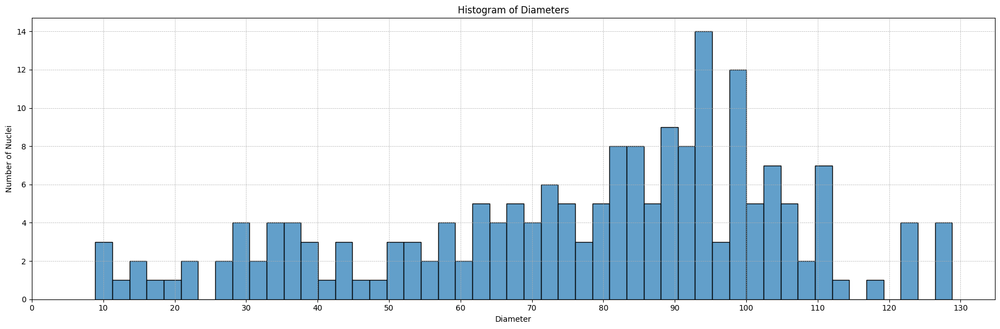

In [19]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='equivalent_diameter', bins=50, element='bars', stat='count', alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Diameters')
plt.xlabel('Diameter')
plt.ylabel('Number of Nuclei')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()


Podría cortar tomando sólo los objetos con diámetro > 24.

In [28]:
# --------- Voronoi Teselation ---------
# (including artificial points to limit cell regions)

# Centers of segmented nuclei
centroids = df[['centroid-1', 'centroid-0']].values

# Calculate the center and the radius for the large circle
center_of_spheroid = np.mean(centroids, axis=0)
total_spheroid_radius = np.max(np.sqrt(np.sum((centroids - center_of_spheroid)**2, axis=1)))

# Define the radius of the large bounding circle
gamma = 1.2
large_circle_radius = gamma * total_spheroid_radius

# Generate 50 points on the large circle
num_artificial_points = 100
angles = np.linspace(0, 2 * np.pi, num_artificial_points, endpoint=False)
artificial_points_x = center_of_spheroid[0] + large_circle_radius * np.cos(angles)
artificial_points_y = center_of_spheroid[1] + large_circle_radius * np.sin(angles)
artificial_points = np.stack((artificial_points_x, artificial_points_y), axis=1)

# Combine the original centroids with the artificial points
all_points = np.vstack((centroids, artificial_points))

# Calculate the Voronoi diagram for the combined points
vor = Voronoi(all_points)

In [29]:
# --------- Counting Fluorescence Intensity in each region ---------
# (excluding artificial points)

sox2_img = hdome[z_slice]
# sox2_img = average_hdome_adapteq

# Create a blank image for Voronoi segmentation
voronoi_regions = np.zeros_like(sox2_img, dtype=int)

intensity_sums = [0] * len(centroids)  # Initialize intensity sums with zeros

# Iterate through each original point's region
for point_idx, region_idx in enumerate(vor.point_region[:len(centroids)]):  # Only original points
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0:  # Check if the region is not infinite and not empty
        polygon_points = [vor.vertices[i] for i in region]
        polygon = Polygon(polygon_points)

        # Fix any invalid polygons
        if not polygon.is_valid:
            polygon = polygon.buffer(0)

        # Draw the polygon to get the region
        rr, cc = skimage.draw.polygon(polygon.exterior.xy[1], polygon.exterior.xy[0], voronoi_regions.shape)
        voronoi_regions[rr, cc] = point_idx + 1  # Add 1 to avoid using zero as a label
        intensity_sums[point_idx] += np.sum(sox2_img[rr, cc])  # Update the intensity sum for this region

# Add the intensity sums to the dataframe
df['Fluorescence_Intensity'] = intensity_sums

In [30]:
# --------- Defining in_spheroid cells ---------
# We consider cells to be in the spheroid if they are within a certain radius from the center.

# Define alpha and add the 'in_spheroid' column
alpha = 0.95
df['in_spheroid'] = df['distance_to_center'] <= alpha * total_spheroid_radius

# Display counts
df['in_spheroid'].value_counts()


in_spheroid
True     183
False      6
Name: count, dtype: int64

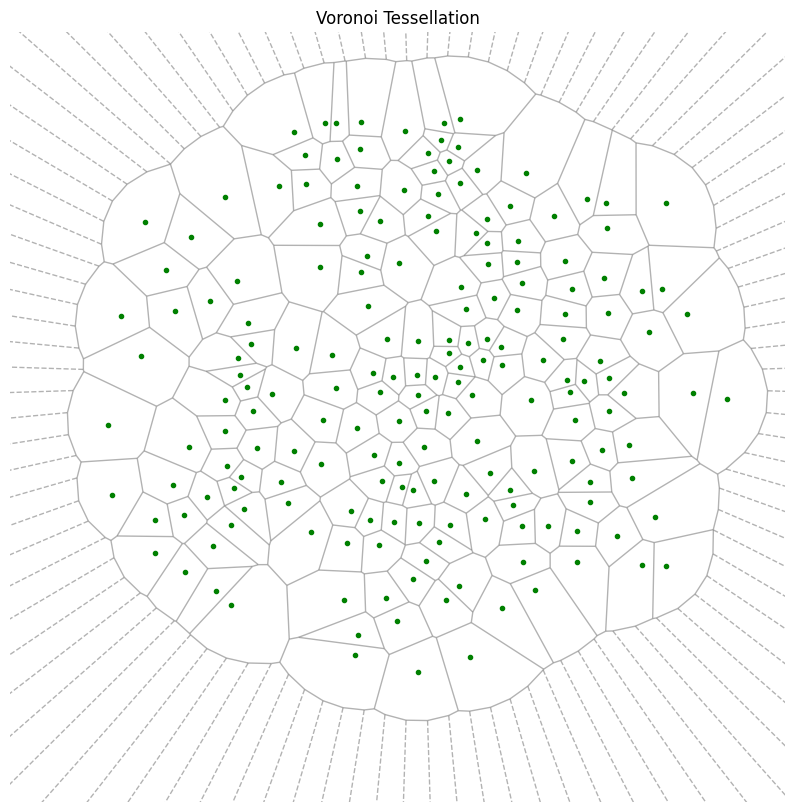

In [70]:
# --------- Voronoi Tessellation ---------

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid


ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation')
plt.axis('off')

plt.show()

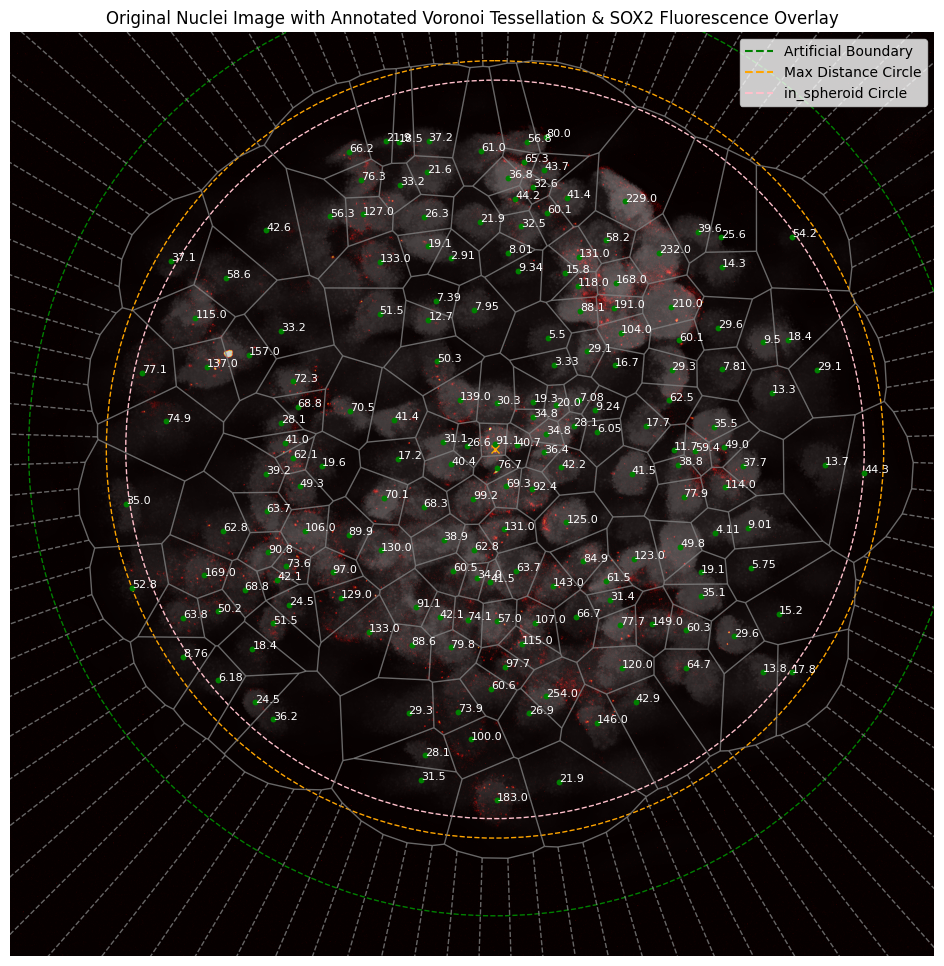

In [65]:
# --------- Regions, Nuclei and SOX2 Overlay ---------

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(12, 12)) # I used a 10x10 figure for the original image, 12x12 is better for the annotated one
ax.imshow(image_opened_bilateral, cmap='gray')


# ---

# Center of spheroid
ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# Coloring Circle
circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
ax.add_patch(circle)

# Max distance circle
circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
ax.add_patch(circle)

# in_spheroid Circle
circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
ax.add_patch(circle)

# ---

# Annotate each centroid with its Fluorescence_Intensity, using only the first two significant digits
for idx, (r, c) in enumerate(centroids):
    intensity = df.at[idx, 'Fluorescence_Intensity']
    intensity = float(f'{intensity:.3g}')
    ax.plot(r, c, 'g.')  # Mark the centroid
    ax.text(r, c, str(intensity), color='white', fontsize=8)  # Annotate with intensity

# ---


# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.8)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid


# Let's include the legend for the circles
legend_labels = [Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
                 Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
                 Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Annotated Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

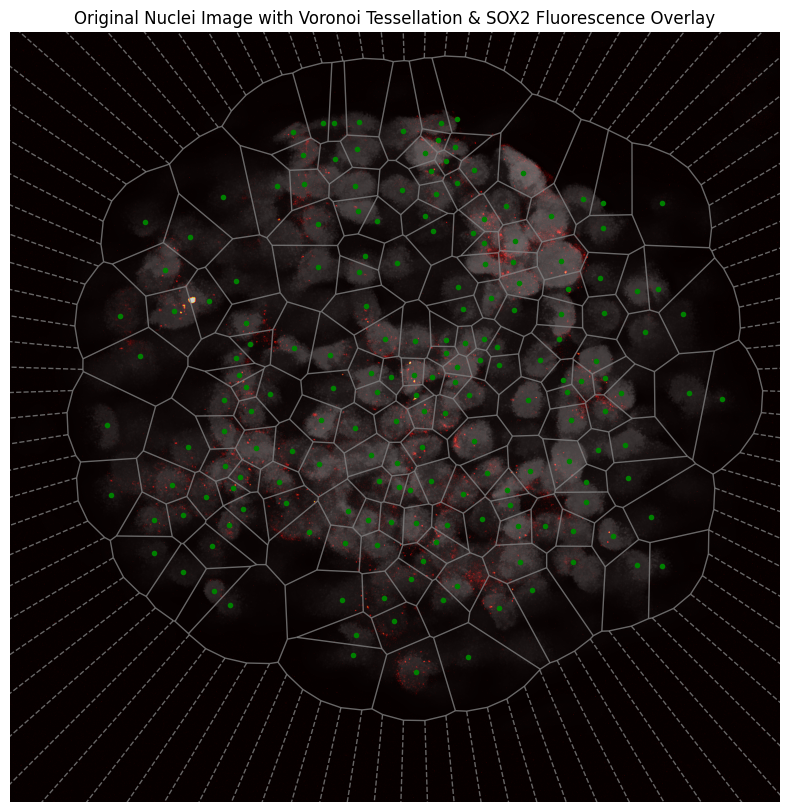

In [67]:
# --------- Regions, Nuclei and SOX2 Overlay ---------

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10)) # I used a 10x10 figure for the original image, 12x12 is better for the annotated one
ax.imshow(image_opened_bilateral, cmap='gray')

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# # Annotate each centroid with its Fluorescence_Intensity, using only the first two significant digits
# for idx, (r, c) in enumerate(centroids):
#     intensity = df.at[idx, 'Fluorescence_Intensity']
#     intensity = float(f'{intensity:.3g}')
#     ax.plot(r, c, 'g.')  # Mark the centroid
#     ax.text(r, c, str(intensity), color='white', fontsize=8)  # Annotate with intensity

# ---


# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.8)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid


# # Let's include the legend for the circles
# legend_labels = [Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

# ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

## Stem and Differentiated Cell Clustering

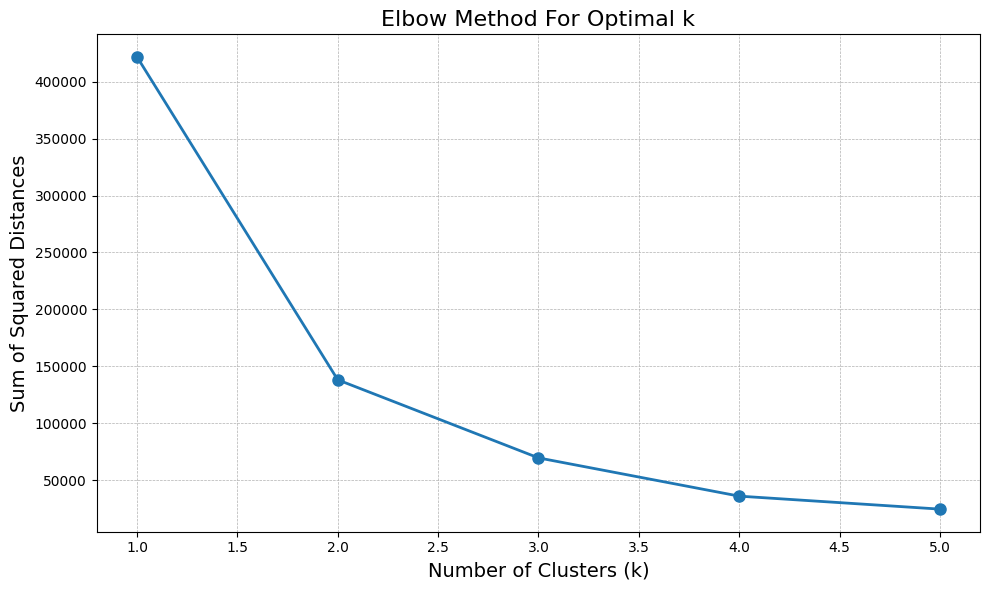

In [34]:
# --------- Elbow plot for cluster number ---------

# Extract fluorescence intensity values from the DataFrame
fluorescence_intensities = df['Fluorescence_Intensity'].loc[df["in_spheroid"]==True].values.reshape(-1, 1)

# Calculate sum of squared distances (SSD) for different values of k
ssd = []
range_n_clusters = range(1, 6)

for num_clusters in range_n_clusters:
    kmeans = KMeans(n_clusters=num_clusters, init='k-means++', n_init='auto', random_state=42)
    kmeans.fit(fluorescence_intensities)
    ssd.append(kmeans.inertia_)

# Plot the SSD values against k to visualize the elbow
plt.figure(figsize=(10, 6))
plt.plot(range_n_clusters, ssd, 'o-', linewidth=2, markersize=8)
plt.xlabel('Number of Clusters (k)', fontsize=14)
plt.ylabel('Sum of Squared Distances', fontsize=14)
plt.title('Elbow Method For Optimal k', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()
plt.show()

In [36]:
# ======== Original Way ========

# Filter out regions with Fluorescence_Intensity <= 180
filtered_df = df[df['Fluorescence_Intensity'] <= 180].copy()  # Use copy() to ensure we're working on a copy

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)

# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_GMM_stemness'] = labels


# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['filtered_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df['filtered_GMM_stemness'])

# Set the values to 1 where Fluorescence_Intensity > 180
df.loc[df['Fluorescence_Intensity'] > 180, 'filtered_GMM_stemness'] = 1


In [37]:
# ========== NEW CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID (still with <180 fliter) ==========

# Filter out regions with Fluorescence_Intensity <= 180 and in_spheroid = True
filtered_df = df[(df['Fluorescence_Intensity'] <= 180) & (df['in_spheroid'])].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'filtered_in_spheroid_GMM_stemness'] = labels

# Create a new column in the original dataframe for the mapped labels, initialized to NaN
df['filtered_in_spheroid_GMM_stemness'] = np.nan

# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['filtered_in_spheroid_GMM_stemness']])

# Set the values to 1 where Fluorescence_Intensity > 180 and in_spheroid = True
df.loc[(df['Fluorescence_Intensity'] > 180) & (df['in_spheroid']), 'filtered_in_spheroid_GMM_stemness'] = 1


In [38]:
# ========== CUTTING DISTRIBUTION TAILS ==========

# Calculate the 5th and 95th percentile values of Fluorescence_Intensity
lower_threshold = df['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df['Fluorescence_Intensity'].quantile(0.95)

# Initialize the 'tails_cut_GMM_stemness' column with NaN
df['tails_cut_GMM_stemness'] = np.nan

# Assign 0 to the 5% lowest intensity regions (non-stem)
df.loc[df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_GMM_stemness'] = 0

# Assign 1 to the 95% highest intensity regions (stem)
df.loc[df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_GMM_stemness'] = 1

# Filter the dataframe for the regions to be included in GMM clustering
filtered_df = df[(df['Fluorescence_Intensity'] > lower_threshold) & (df['Fluorescence_Intensity'] < upper_threshold)].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_GMM_stemness'] = labels

# Update the original dataframe with the GMM clustering results
df.update(filtered_df['tails_cut_GMM_stemness'])



In [39]:
df['tails_cut_GMM_stemness'].value_counts()

tails_cut_GMM_stemness
0.0    139
1.0     50
Name: count, dtype: int64

In [40]:
df['tails_cut_GMM_stemness'].info()

<class 'pandas.core.series.Series'>
RangeIndex: 189 entries, 0 to 188
Series name: tails_cut_GMM_stemness
Non-Null Count  Dtype  
--------------  -----  
189 non-null    float64
dtypes: float64(1)
memory usage: 1.6 KB


In [41]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========


# Calculate the 5th and 95th percentile values of Fluorescence_Intensity within the spheroid
lower_threshold = df[df['in_spheroid']]['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df[df['in_spheroid']]['Fluorescence_Intensity'].quantile(0.95)

# Initialize the 'tails_cut_in_spheroid_GMM_stemness' column with NaN (into which we'll map the GMM labels)
df['tails_cut_in_spheroid_GMM_stemness'] = np.nan

# Assign 0 to the 5% lowest intensity regions within the spheroid (non-stem)
df.loc[(df['Fluorescence_Intensity'] <= lower_threshold) & (df['in_spheroid']), 'tails_cut_in_spheroid_GMM_stemness'] = 0

# Assign 1 to the 95% highest intensity regions within the spheroid (stem)
df.loc[(df['Fluorescence_Intensity'] >= upper_threshold) & (df['in_spheroid']), 'tails_cut_in_spheroid_GMM_stemness'] = 1

# Filter the dataframe for the regions to be included in GMM clustering (inside the spheroid and not in the tails)
filtered_df = df[(df['Fluorescence_Intensity'] > lower_threshold) & 
                 (df['Fluorescence_Intensity'] < upper_threshold) & 
                 (df['in_spheroid'])].copy()

# Reshape the Fluorescence_Intensity data for clustering
X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

# Set a seed for reproducibility
random_state = 42

# Perform GMM clustering with k=2, using the random_state for reproducibility
gmm = GaussianMixture(n_components=2, random_state=random_state)
gmm.fit(X)


# Get the clustering labels
labels = gmm.predict(X)

# Compute the mean fluorescence intensity for each cluster
cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

# Identify the labels of the clusters with higher and lower mean intensities
label_higher_intensity = cluster_means.argmax()
label_lower_intensity = cluster_means.argmin()

# Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
labels[labels == label_lower_intensity] = 0
labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

# Assign the corrected labels to the filtered dataframe
filtered_df.loc[:, 'tails_cut_in_spheroid_GMM_stemness'] = labels


# Map the GMM_stemness labels back to the original df
df.update(filtered_df[['tails_cut_in_spheroid_GMM_stemness']])

# Note: Regions outside the spheroid or in the tails are already handled with NaN or the set values (0 and 1)


In [42]:
df[['label', 'Fluorescence_Intensity', 'filtered_GMM_stemness', 'filtered_in_spheroid_GMM_stemness', 'tails_cut_GMM_stemness', 'tails_cut_in_spheroid_GMM_stemness']].loc[df['Fluorescence_Intensity']>85].loc[df['Fluorescence_Intensity']<95].sort_values(by='Fluorescence_Intensity')

,label,Fluorescence_Intensity,filtered_GMM_stemness,filtered_in_spheroid_GMM_stemness,tails_cut_GMM_stemness,tails_cut_in_spheroid_GMM_stemness
35,36,88.072580,1.0,1.0,1.0,1.0
48,49,88.554719,1.0,1.0,1.0,1.0
10,11,89.908675,1.0,1.0,1.0,1.0
16,17,90.837186,1.0,1.0,1.0,1.0
76,77,91.050668,1.0,1.0,1.0,1.0
173,174,91.073426,1.0,1.0,1.0,1.0
143,144,92.442489,1.0,1.0,1.0,1.0


### Summary

In [43]:
# ========== CALCULATING SUMMARY STATISTICS ==========

# ====== General Information ======
czi_file_name = os.path.basename(czi_file_path)
total_cells = df.shape[0]
cells_in_spheroid = df.loc[df['in_spheroid']==True].shape[0]
cells_outside_spheroid = df.loc[df['in_spheroid']==False].shape[0]


# ====== For 'filtered_GMM_stemness' ======
filtered_GMM_stemness_ones = df['filtered_GMM_stemness'].sum()
percentage_filtered_GMM_stemness_ones = filtered_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'filtered_in_spheroid_GMM_stemness' ======
filtered_in_spheroid_GMM_stemness_ones = df['filtered_in_spheroid_GMM_stemness'].sum()
percentage_in_sph_filtered_in_spheroid_GMM_stemness_ones = filtered_in_spheroid_GMM_stemness_ones / df.loc[df['in_spheroid']==True].shape[0] * 100
percentage_total_filtered_in_spheroid_GMM_stemness_ones = filtered_in_spheroid_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'tails_cut_GMM_stemness' ======
tails_cut_GMM_stemness_ones = df['tails_cut_GMM_stemness'].sum()
percentage_tails_cut_GMM_stemness_ones = tails_cut_GMM_stemness_ones / df.shape[0] * 100


# ====== For 'tails_cut_in_spheroid_GMM_stemness' ======
tails_cut_in_spheroid_GMM_stemness_ones = df['tails_cut_in_spheroid_GMM_stemness'].sum()
percentage_in_sph_tails_cut_in_spheroid_GMM_stemness_ones = tails_cut_in_spheroid_GMM_stemness_ones / df.loc[df['in_spheroid']==True].shape[0] * 100
percentage_total_tails_cut_in_spheroid_GMM_stemness_ones = tails_cut_in_spheroid_GMM_stemness_ones / df.shape[0] * 100


# ====== Calculate thresholds for each feature ======
def calculate_thresholds(df, feature):
    # Sort the DataFrame by Fluorescence_Intensity
    sorted_df = df.sort_values(by='Fluorescence_Intensity')
    # Identify the max intensity for class 0 and min intensity for class 1
    max_intensity_class_0 = sorted_df[sorted_df[feature] == 0]['Fluorescence_Intensity'].max()
    min_intensity_class_1 = sorted_df[sorted_df[feature] == 1]['Fluorescence_Intensity'].min()
    # Calculate the average to define the threshold
    return (max_intensity_class_0 + min_intensity_class_1) / 2.0

# Calculate thresholds
threshold_filtered_GMM = calculate_thresholds(df, 'filtered_GMM_stemness')
threshold_filtered_in_spheroid = calculate_thresholds(df[df['in_spheroid']==True], 'filtered_in_spheroid_GMM_stemness')
threshold_tails_cut = calculate_thresholds(df, 'tails_cut_GMM_stemness')
threshold_tails_cut_in_spheroid = calculate_thresholds(df[df['in_spheroid']==True], 'tails_cut_in_spheroid_GMM_stemness')


# ========== PRINTING THE SUMMARY STATISTICS ==========
print('-------------------- SUMMARY ------------------------')

# General information
print(f"File name: {czi_file_name}")
print(f'Slice: {z_slice}')
print(f"Total number of cells: {total_cells}")
print(f"Number of cells in the spheroid: {cells_in_spheroid}")
print(f"Number of cells outside the spheroid: {cells_outside_spheroid}")
print('--------------------------------------------')

# For 'filtered_GMM_stemness'
print(f"Number of CSCs according to filtered_GMM_stemness: {filtered_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {total_cells - filtered_GMM_stemness_ones}')
print(f'They represent {percentage_filtered_GMM_stemness_ones:.2f}% of the total number of cells.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_filtered_GMM:.4f}.')
print('--------------------------------------------')

# For 'filtered_in_spheroid_GMM_stemness'
print(f"Number of CSCs according to filtered_in_spheroid_GMM_stemness: {filtered_in_spheroid_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {cells_in_spheroid - filtered_in_spheroid_GMM_stemness_ones}')
print(f'They represent {percentage_total_filtered_in_spheroid_GMM_stemness_ones:.2f}% of the total number of cells,')
print(f'and {percentage_in_sph_filtered_in_spheroid_GMM_stemness_ones:.2f}% of the number of cells in the spheroid.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_filtered_in_spheroid:.4f}.')
print('--------------------------------------------')

# For 'tails_cut_GMM_stemness'
print(f"Number of CSCs according to tails_cut_GMM_stemness: {tails_cut_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {total_cells - tails_cut_GMM_stemness_ones}')
print(f'They represent {percentage_tails_cut_GMM_stemness_ones:.2f}% of the total number of cells.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_tails_cut:.4f}.')
print('--------------------------------------------')

# For 'tails_cut_in_spheroid_GMM_stemness'
print(f"Number of CSCs according to tails_cut_in_spheroid_GMM_stemness: {tails_cut_in_spheroid_GMM_stemness_ones}")
print(f'Corresponding number of DCCs: {cells_in_spheroid - tails_cut_in_spheroid_GMM_stemness_ones}')
print(f'They represent {percentage_total_tails_cut_in_spheroid_GMM_stemness_ones:.2f}% of the total number of cells,')
print(f'and {percentage_in_sph_tails_cut_in_spheroid_GMM_stemness_ones:.2f}% of the number of cells in the spheroid.')
print(f'The threshold is roughly at a fluorescence intensity of {threshold_tails_cut_in_spheroid:.4f}.')
print('--------------------------------------------')


-------------------- SUMMARY ------------------------
File name: Sph1 Z Stack - CTRL SOX2.czi
Slice: 3
Total number of cells: 189
Number of cells in the spheroid: 183
Number of cells outside the spheroid: 6
--------------------------------------------
Number of CSCs according to filtered_GMM_stemness: 48.0
Corresponding number of DCCs: 141.0
They represent 25.40% of the total number of cells.
The threshold is roughly at a fluorescence intensity of 76.8995.
--------------------------------------------
Number of CSCs according to filtered_in_spheroid_GMM_stemness: 48.0
Corresponding number of DCCs: 135.0
They represent 25.40% of the total number of cells,
and 26.23% of the number of cells in the spheroid.
The threshold is roughly at a fluorescence intensity of 76.8995.
--------------------------------------------
Number of CSCs according to tails_cut_GMM_stemness: 50.0
Corresponding number of DCCs: 139.0
They represent 26.46% of the total number of cells.
The threshold is roughly at a fl

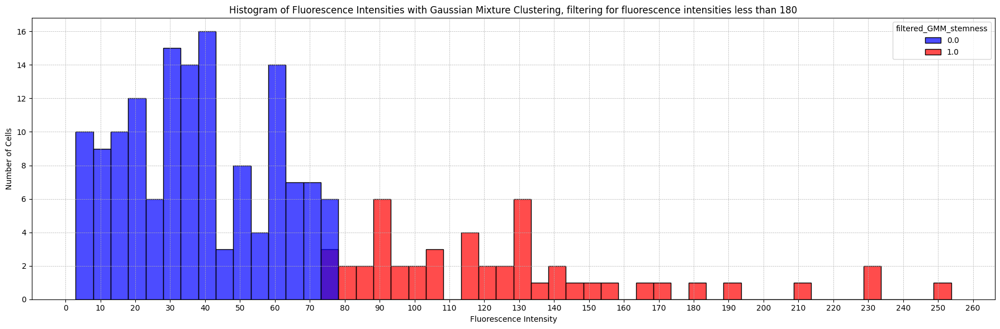

In [44]:
plt.figure(figsize=(18, 6))
sns.histplot(df, x='Fluorescence_Intensity', hue='filtered_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

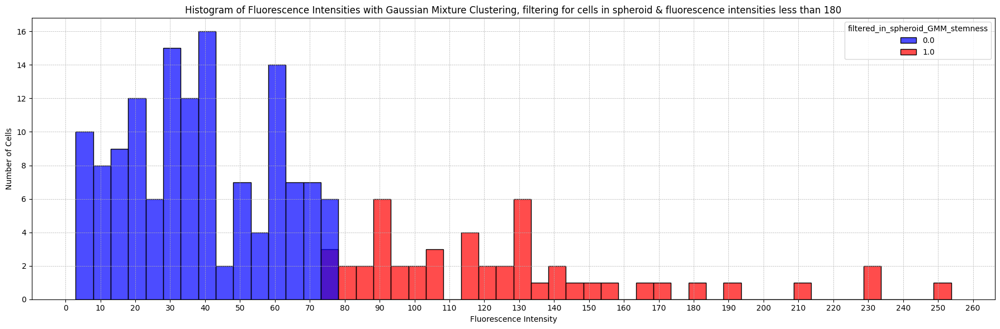

In [45]:
# ========== NEW CLUSTERING EXCLUDING CELLS OUTSIDE THE SPHEROID ==========

plt.figure(figsize=(18, 6))
df_in_spheroid = df.loc[df['in_spheroid']==True].copy()
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='filtered_in_spheroid_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for cells in spheroid & fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

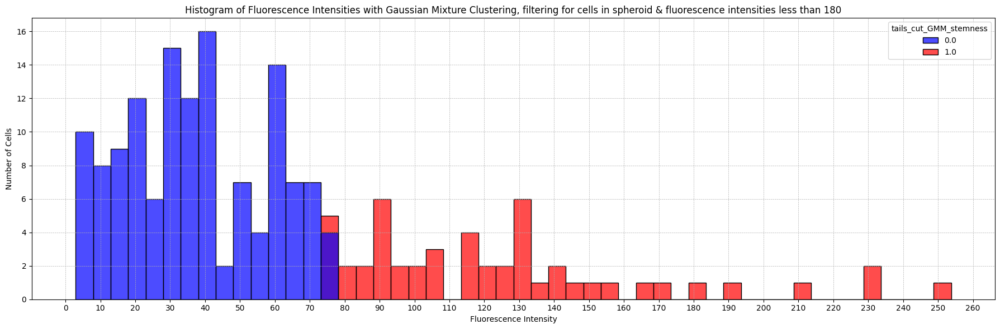

In [46]:
# ========== CUTTING DISTRIBUTION TAILS ==========

plt.figure(figsize=(18, 6))
df_in_spheroid = df.loc[df['in_spheroid']==True].copy()
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering, filtering for cells in spheroid & fluorescence intensities less than 180')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()



# # Save the plot to your computer
# filename = "/content/histogram_GMM-means-filtered-intensity<180_clustering.png"  # Path to save the plot in Colab's virtual environment
# plt.savefig(filename)

# # To download the file to your local machine from Colab
# from google.colab import files
# files.download(filename)



plt.show()

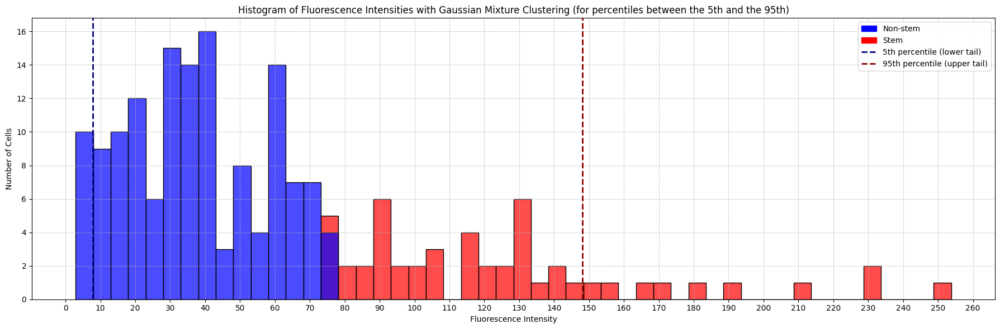

In [47]:
# ========== CUTTING DISTRIBUTION TAILS: TAILS INDICATED ==========

plt.figure(figsize=(18, 6))

# In this case, we do NOT filter for cells in the spheroid, so we use the original df
df_in_spheroid = df

# Main histogram plot for 'tails_cut_GMM_stemness'
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Calculate the 5th and 95th percentile values
lower_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.95)

# Plotting vertical lines to indicate the 5th and 95th percentile thresholds
lower_tail_line = plt.axvline(x=lower_threshold, color='navy', linestyle='--', linewidth=2)
upper_tail_line = plt.axvline(x=upper_threshold, color='darkred', linestyle='--', linewidth=2)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering (for percentiles between the 5th and the 95th)')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Create custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='Non-stem'),
                   Patch(facecolor='red', edgecolor='red', label='Stem'),
                   Line2D([0], [0], color='navy', linestyle='--', linewidth=2, label='5th percentile (lower tail)'),
                   Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='95th percentile (upper tail)')]

plt.legend(handles=legend_elements)

plt.show()



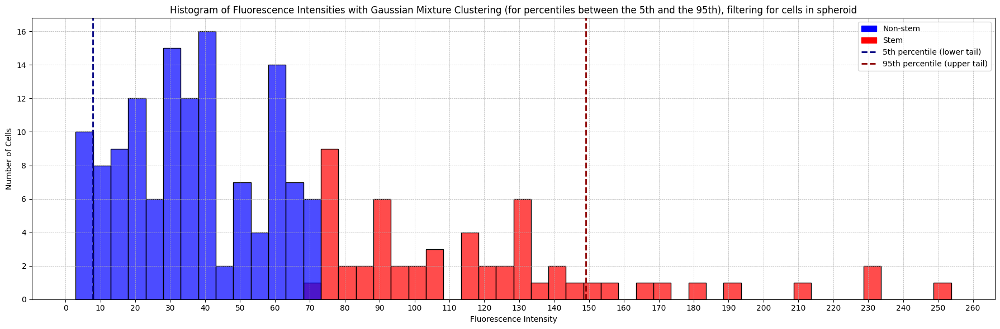

In [48]:
# ========== EXCLUDING CELLS OUTSIDE THE SPHEROID AND CUTTING DISTRIBUTION TAILS ==========


plt.figure(figsize=(18, 6))

# Create a dataframe for cells in the spheroid
df_in_spheroid = df.loc[df['in_spheroid'] == True].copy()

# Main histogram plot for 'tails_cut_GMM_stemness'
sns.histplot(df_in_spheroid, x='Fluorescence_Intensity', hue='tails_cut_in_spheroid_GMM_stemness', bins=50, palette=['blue', 'red'], element='bars', stat='count', common_norm=False, alpha=0.7)

# Calculate the 5th and 95th percentile values
lower_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.05)
upper_threshold = df_in_spheroid['Fluorescence_Intensity'].quantile(0.95)

# Plotting vertical lines to indicate the 5th and 95th percentile thresholds
lower_tail_line = plt.axvline(x=lower_threshold, color='navy', linestyle='--', linewidth=2)
upper_tail_line = plt.axvline(x=upper_threshold, color='darkred', linestyle='--', linewidth=2)

# Plot customization to resemble the original plot
plt.title('Histogram of Fluorescence Intensities with Gaussian Mixture Clustering (for percentiles between the 5th and the 95th), filtering for cells in spheroid')
plt.xlabel('Fluorescence Intensity')
plt.ylabel('Number of Cells')

# Set x-ticks starting from 0 and every 10 units
xmax = plt.xlim()[1]  # Get the current maximum xlim value
plt.xticks(np.arange(0, xmax+1, 10))

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.tight_layout()

# Create custom legend
legend_elements = [Patch(facecolor='blue', edgecolor='blue', label='Non-stem'),
                   Patch(facecolor='red', edgecolor='red', label='Stem'),
                   Line2D([0], [0], color='navy', linestyle='--', linewidth=2, label='5th percentile (lower tail)'),
                   Line2D([0], [0], color='darkred', linestyle='--', linewidth=2, label='95th percentile (upper tail)')]

plt.legend(handles=legend_elements)

plt.show()


Notar como la línea del percentil 5 se mueve a la derecha. Esto tiene que ver con que excluir células fuera del esferoide, es excluir las sueltas y algunas del borde. Las del borde suelen tener mucha limpieza de SOX2 a su alrededor, por lo que pueden ser altas o bajas según la teselación de ese caso particular. Las que están lejos del esferoide (sueltas), pueden tener mucho SOX2 porque la limpieza no las afecta tanto, pero en general involucran áreas que casi no tienen SOX2 en primer lugar. Como resultado, si bien pueden haber excepciones por los motivos mencionados, excluir células fuera del esferoide puede ya estarme excluyendo fluorescencias bajas (lo que mueve la línea del percentil 5 a la derecha).

In [49]:
# Save the DataFrame to a CSV

# Define the directory path
directory = f"./results/sph1_reprocessed/slice_{z_slice}/"
csv_file_path = os.path.join(directory, f"sph1_slice_{z_slice}.csv") # _artificial_boundary

# # Save the DataFrame to a CSV in the specified directory
# df.to_csv(csv_file_path, index=False)


## Plots

### Criterion: `filtered_GMM_stemness`

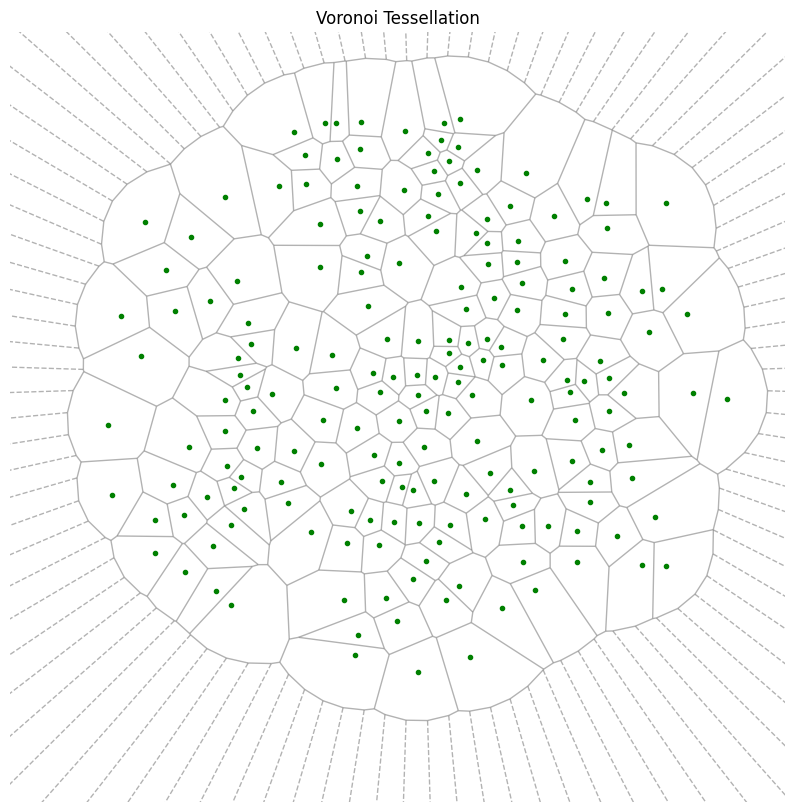

In [57]:
# ========== CRITERION: filtered_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness filtered_GMM_stemness
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# # Display the colored Voronoi overlay
# ax.imshow(voronoi_overlay, alpha=0.8)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

# ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation')
plt.axis('off')

plt.show()

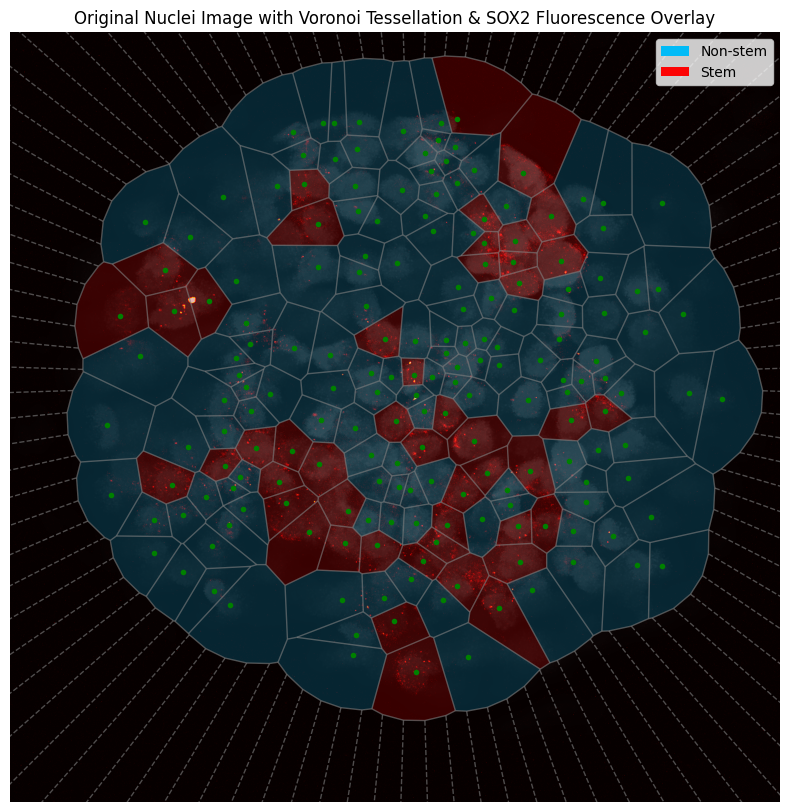

In [52]:
# ========== CRITERION: filtered_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness filtered_GMM_stemness
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

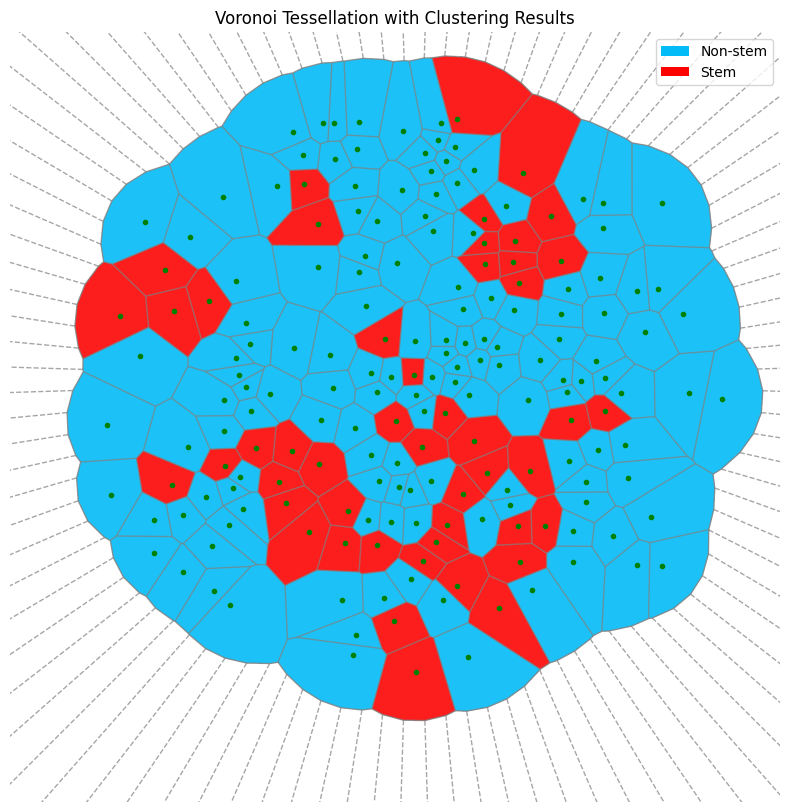

In [61]:
# ========== CRITERION: filtered_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_GMM_stemness'] # tails_cut_in_spheroid_GMM_stemness filtered_GMM_stemness
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

### Criterion: `filtered_in_spheroid_GMM_stemness`

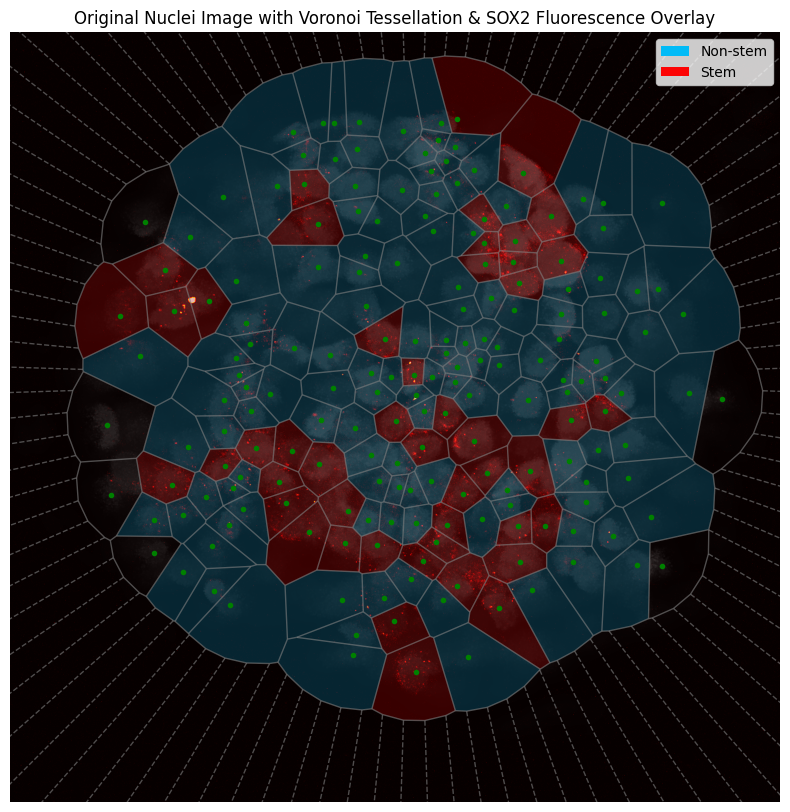

In [71]:
# ========== CRITERION: filtered_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

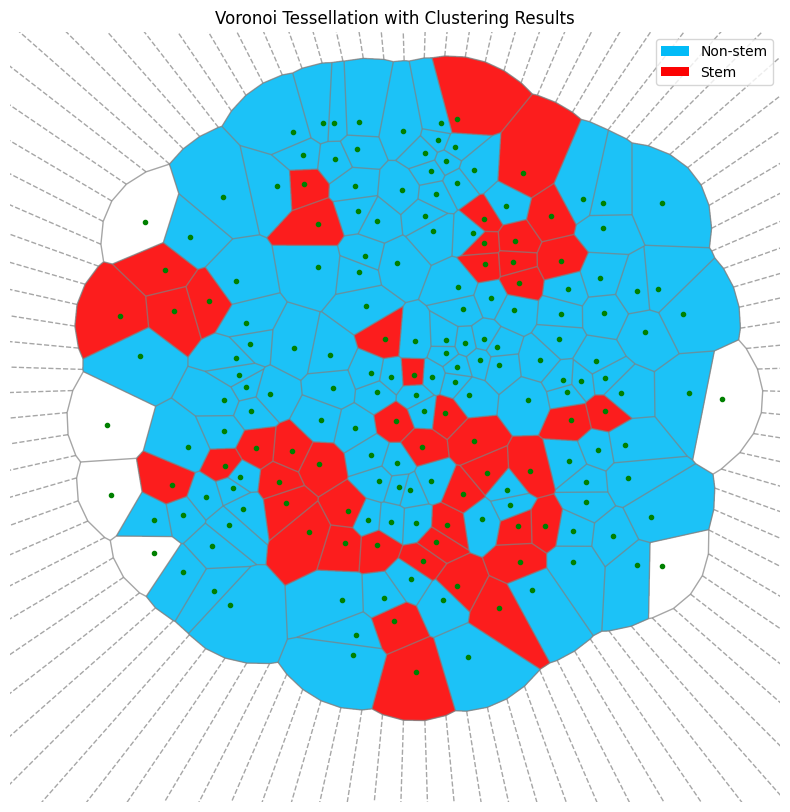

In [72]:
# ========== CRITERION: filtered_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'filtered_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

### Criterion: `tails_cut_GMM_stemness`

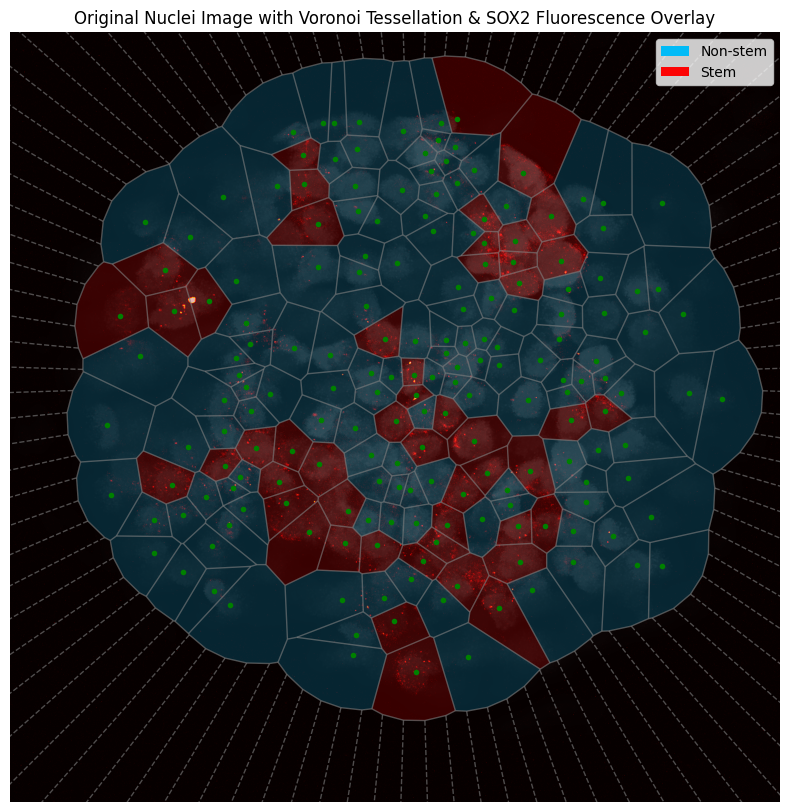

In [77]:
# ========== CRITERION: tails_cut_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

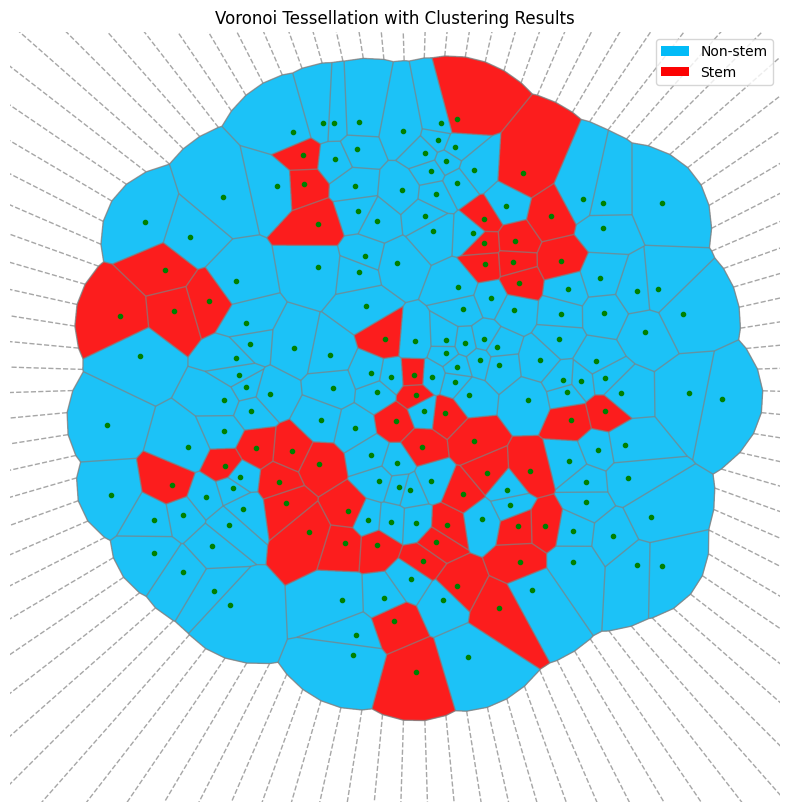

In [78]:
# ========== CRITERION: tails_cut_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

### Criterion: `tails_cut_in_spheroid_GMM_stemness`

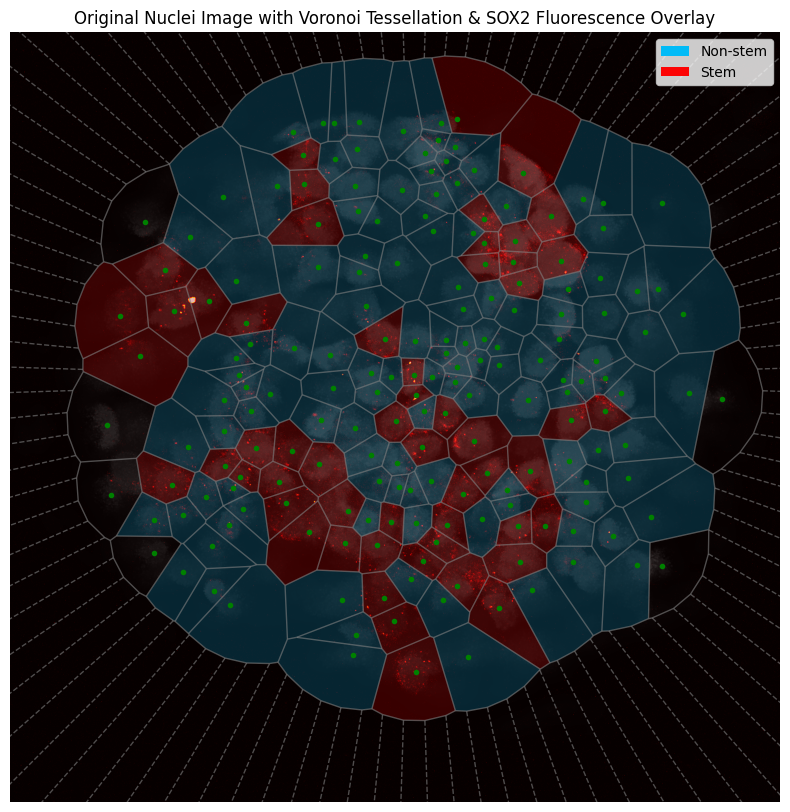

In [79]:
# ========== CRITERION: tails_cut_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.5)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.6)

# Overlay the fluorescence channel using a colormap.
ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Original Nuclei Image with Voronoi Tessellation & SOX2 Fluorescence Overlay')
plt.axis('off')

plt.show()

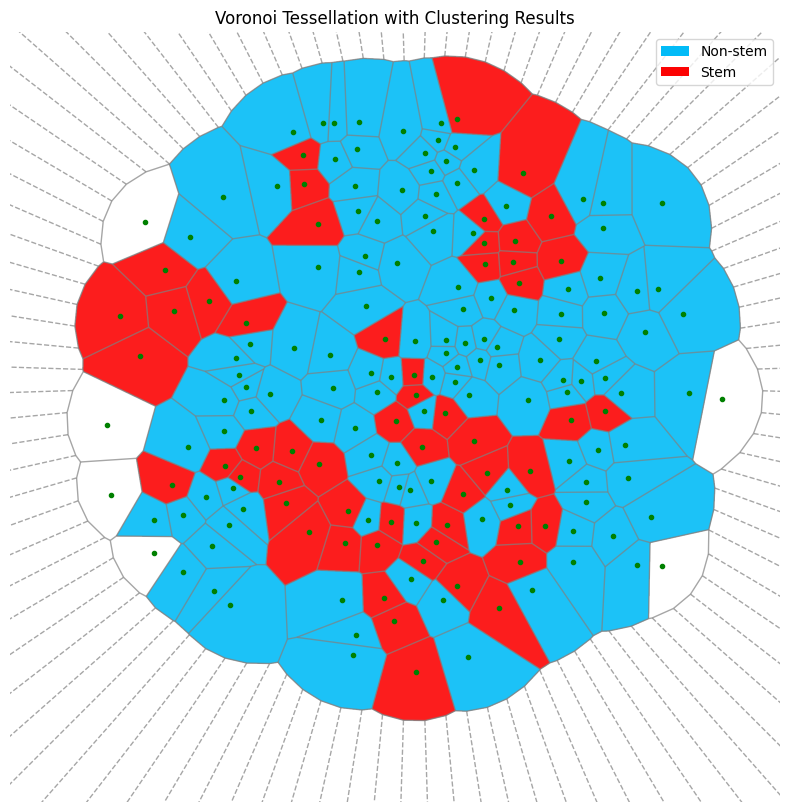

In [80]:
# ========== CRITERION: tails_cut_in_spheroid_GMM_stemness ==========


# Define a soft, pastel colormap
pastel_cmap = ListedColormap(['#02bbf7', '#fc0303'])  # light blue and light red

# Start the plot and display the original image
fig, ax = plt.subplots(figsize=(10, 10))
# ax.imshow(image_opened_bilateral, cmap='gray')

# Create an empty image to overlay the Voronoi regions
voronoi_overlay = np.zeros(image_opened_bilateral.shape + (4,), dtype=np.uint8)  # 4 for RGBA

# ---

# # Center of spheroid
# ax.plot(*center_of_spheroid[::1], color='orange', marker='x')

# # Coloring Circle
# circle = Circle(center_of_spheroid[::1], large_circle_radius, fill=False, color='green', linestyle='--', label='Artificial Boundary')
# ax.add_patch(circle)

# # Max distance circle
# circle = Circle(center_of_spheroid[::1], total_spheroid_radius, fill=False, color='orange', linestyle='--', label='Max Distance Circle')
# ax.add_patch(circle)

# # in_spheroid Circle
# circle = Circle(center_of_spheroid[::1], alpha * total_spheroid_radius, fill=False, color='pink', linestyle='--', label='in_spheroid Circle')
# ax.add_patch(circle)

# ---

# Fill the Voronoi regions with color based on 'tails_cut_in_spheroid_GMM_stemness'
for point_idx, region_idx in enumerate(vor.point_region):
    region = vor.regions[region_idx]
    if not -1 in region and len(region) > 0 and point_idx < len(centroids):  # Ensure we only color the original points
        polygon = [vor.vertices[i] for i in region]
        rr, cc = skimage.draw.polygon([p[1] for p in polygon], [p[0] for p in polygon], image_opened_bilateral.shape)
        
        # Get the corresponding index in the original DataFrame
        original_idx = df.iloc[point_idx].name
        
        # Get the color based on 'tails_cut_in_spheroid_GMM_stemness'
        stemness_value = df.at[original_idx, 'tails_cut_in_spheroid_GMM_stemness'] # CRITERON HERE
        
        # Check if stemness_value is not NaN before setting the color
        if not np.isnan(stemness_value):
            color = pastel_cmap(stemness_value)
            voronoi_overlay[rr, cc] = np.array(color)*255  # Assuming 'color' is an RGBA tuple

# Display the colored Voronoi overlay
ax.imshow(voronoi_overlay, alpha=0.9)  # Adjust alpha for desired transparency

# Overlay the Voronoi diagram without the points, with yellow lines for boundaries
voronoi_plot_2d(vor, ax=ax, show_points=False, show_vertices=False, line_colors='gray', line_width=1, line_alpha=0.7)

# # Overlay the fluorescence channel using a colormap.
# ax.imshow(hdome[z_slice], cmap='hot', alpha=0.6)  # Adjust alpha for desired transparency of overlay

# Display the centroids
for (r, c) in centroids:
    ax.plot(r, c, 'g.')  # green dot for each centroid

# Legend for the Voronoi region colors
legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
                 Patch(facecolor=pastel_cmap(1), label='Stem')]

# # Let's include the legend for the circles
# legend_labels = [Patch(facecolor=pastel_cmap(0), label='Non-stem'), 
#                  Patch(facecolor=pastel_cmap(1), label='Stem'),
#                  Line2D([0], [0], color='green', linestyle='--', label='Artificial Boundary'),
#                  Line2D([0], [0], color='orange', linestyle='--', label='Max Distance Circle'),
#                  Line2D([0], [0], color='pink', linestyle='--', label='in_spheroid Circle')]

ax.legend(handles=legend_labels, loc='upper right')

ax.set_xlim([0, image_opened_bilateral.shape[1]])
ax.set_ylim([image_opened_bilateral.shape[0], 0])
ax.set_title('Voronoi Tessellation with Clustering Results')
plt.axis('off')

plt.show()

## Random State Statistics
The clustering appears to vary significantly depending on the seed (`random_state`). Let's take a criterion and do the clustering for several different seeds. For this test, I'll use the `tails_cut_GMM_stemness` criterion. I do not use the `tails_cut_in_spheroid_GMM_stemness` criterion because in this case, every cell outside the spheroid gets classified as a non-stem cell.

In [82]:
# Let's check the stemness of the ones outside the spheroid
df.loc[df['in_spheroid'] == False, ['label', 'tails_cut_in_spheroid_GMM_stemness', 'tails_cut_GMM_stemness', 'filtered_in_spheroid_GMM_stemness', 'filtered_GMM_stemness']]

,label,tails_cut_in_spheroid_GMM_stemness,tails_cut_GMM_stemness,filtered_in_spheroid_GMM_stemness,filtered_GMM_stemness
28,29,NaN,0.0,NaN,0.0
31,32,NaN,0.0,NaN,0.0
154,155,NaN,0.0,NaN,0.0
157,158,NaN,0.0,NaN,0.0
158,159,NaN,0.0,NaN,0.0
168,169,NaN,0.0,NaN,0.0


In [115]:
# ========== MANY SEEDS FOR GMM CLUSTERING CUTTING DISTRIBUTION TAILS ==========


# Function to calculate thresholds for each feature
def calculate_thresholds(sorted_df, feature):
    max_intensity_class_0 = sorted_df[sorted_df[feature] == 0]['Fluorescence_Intensity'].max()
    min_intensity_class_1 = sorted_df[sorted_df[feature] == 1]['Fluorescence_Intensity'].min()
    return (max_intensity_class_0 + min_intensity_class_1) / 2.0

# Prepare the DataFrame to store the results
results_df = pd.DataFrame(columns=['algorithm', 'random_state', 'num_stem_cells', 'num_non_stem_cells', 'stem_fraction', 'FI_threshold'])

# Generate a large batch of random numbers for seeds
random_states = np.random.randint(0, 1000, size=100)  # 100 different seeds

for random_state in random_states:
    # Start with a fresh copy of the Fluorescence_Intensity data
    current_df = df[['Fluorescence_Intensity', 'in_spheroid']].copy()
    
    # Calculate the 5th and 95th percentile values of Fluorescence_Intensity
    lower_threshold = current_df['Fluorescence_Intensity'].quantile(0.05)
    upper_threshold = current_df['Fluorescence_Intensity'].quantile(0.95)

    # Initialize the 'tails_cut_GMM_stemness' column with NaN
    current_df['tails_cut_GMM_stemness'] = np.nan

    # Assign 0 to the 5% lowest intensity regions (non-stem)
    current_df.loc[current_df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_GMM_stemness'] = 0

    # Assign 1 to the 95% highest intensity regions (stem)
    current_df.loc[current_df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_GMM_stemness'] = 1

    # Filter the dataframe for the regions to be included in GMM clustering
    filtered_df = current_df[(current_df['Fluorescence_Intensity'] > lower_threshold) & (current_df['Fluorescence_Intensity'] < upper_threshold)].copy()

    # Reshape the Fluorescence_Intensity data for clustering
    X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

    # Perform GMM clustering with the current random state
    gmm = GaussianMixture(n_components=2, random_state=random_state)
    gmm.fit(X)
    labels = gmm.predict(X)

    # Compute the mean fluorescence intensity for each cluster
    cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

    # Identify the labels of the clusters with higher and lower mean intensities
    label_higher_intensity = cluster_means.argmax()
    label_lower_intensity = cluster_means.argmin()

    # Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
    labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
    labels[labels == label_lower_intensity] = 0
    labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

    # Assign the corrected labels to the filtered dataframe
    filtered_df.loc[:, 'tails_cut_GMM_stemness'] = labels

    # Update the original dataframe with the GMM clustering results
    current_df.update(filtered_df['tails_cut_GMM_stemness'])

    # Calculate summary statistics
    num_stem_cells = current_df['tails_cut_GMM_stemness'].sum()
    num_non_stem_cells = current_df['tails_cut_GMM_stemness'].count() - num_stem_cells
    stem_fraction = num_stem_cells / current_df['tails_cut_GMM_stemness'].count() * 100
    FI_threshold = calculate_thresholds(current_df, 'tails_cut_GMM_stemness')

    # Store the results
    temp_df = pd.DataFrame({'algorithm': ['GMM'],
                            'random_state': [random_state],
                            'num_stem_cells': [num_stem_cells],
                            'num_non_stem_cells': [num_non_stem_cells],
                            'stem_fraction': [stem_fraction],
                            'FI_threshold': [FI_threshold]})
    results_df = pd.concat([results_df, temp_df], ignore_index=True)

# Display or save the results
results_df
# results_df.to_csv('gmm_clustering_variability.csv', index=False)



3500701756.py (75): The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.


,algorithm,random_state,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
0,GMM,839,50.0,139.0,26.455026,75.617914
1,GMM,521,55.0,134.0,29.100529,71.395235
2,GMM,236,55.0,134.0,29.100529,71.395235
3,GMM,983,55.0,134.0,29.100529,71.395235
4,GMM,543,50.0,139.0,26.455026,75.617914
...,...,...,...,...,...,...
95,GMM,206,55.0,134.0,29.100529,71.395235
96,GMM,562,50.0,139.0,26.455026,75.617914
97,GMM,358,50.0,139.0,26.455026,75.617914
98,GMM,642,50.0,139.0,26.455026,75.617914


In [116]:
results_df.describe()

,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
count,100.000000,100.000000,100.000000,100.000000
mean,53.040000,135.960000,28.063492,73.062353
std,2.428451,2.428451,1.284895,2.045467
min,50.000000,134.000000,26.455026,71.395235
25%,50.000000,134.000000,26.455026,71.395235
50%,55.000000,134.000000,29.100529,71.395235
75%,55.000000,139.000000,29.100529,75.617914
max,55.000000,139.000000,29.100529,75.617914


In [117]:
results_df['FI_threshold'].value_counts()

FI_threshold
71.395235    59
75.617914    38
72.972221     2
74.491279     1
Name: count, dtype: int64

En general, se concentran en los dos mismo valores (71 y 75), y pocas veces se queda al medio. Creo que esto tiene que ver con si la gaussiana mayor se inicializa a la izquierda o a la derecha.

---

Tendríamos que probar qué pasa con otros criterios y tratar de incluirlos en la estadística. Podríamos cambiar los percentiles que cortamos en las colas o el algoritmo (además de los otros 3 criterios que usamos antes).

In [118]:
# ========== MANY SEEDS FOR K-MEANS CLUSTERING CUTTING DISTRIBUTION TAILS ==========

# Generate a large batch of random numbers for seeds
random_states = np.random.randint(0, 1000, size=100)  # 100 different seeds

for random_state in random_states:
    # Start with a fresh copy of the Fluorescence_Intensity data
    current_df = df[['Fluorescence_Intensity', 'in_spheroid']].copy()
    
    # Calculate the 5th and 95th percentile values of Fluorescence_Intensity
    lower_threshold = current_df['Fluorescence_Intensity'].quantile(0.05)
    upper_threshold = current_df['Fluorescence_Intensity'].quantile(0.95)

    # Initialize the 'tails_cut_kmeans_stemness' column with NaN
    current_df['tails_cut_kmeans_stemness'] = np.nan

    # Assign 0 to the 5% lowest intensity regions (non-stem)
    current_df.loc[current_df['Fluorescence_Intensity'] <= lower_threshold, 'tails_cut_kmeans_stemness'] = 0

    # Assign 1 to the 95% highest intensity regions (stem)
    current_df.loc[current_df['Fluorescence_Intensity'] >= upper_threshold, 'tails_cut_kmeans_stemness'] = 1

    # Filter the dataframe for the regions to be included in clustering
    filtered_df = current_df[(current_df['Fluorescence_Intensity'] > lower_threshold) & (current_df['Fluorescence_Intensity'] < upper_threshold)].copy()

    # Reshape the Fluorescence_Intensity data for clustering
    X = filtered_df['Fluorescence_Intensity'].values.reshape(-1, 1)

    # Perform k-means clustering with the current random state
    kmeans = KMeans(n_clusters=2, n_init=20 , random_state=random_state)
    kmeans.fit(X)
    labels = kmeans.predict(X)

    # Compute the mean fluorescence intensity for each cluster
    cluster_means = np.array([filtered_df['Fluorescence_Intensity'][labels == i].mean() for i in np.unique(labels)])

    # Identify the labels of the clusters with higher and lower mean intensities
    label_higher_intensity = cluster_means.argmax()
    label_lower_intensity = cluster_means.argmin()

    # Replace labels to ensure cluster with higher mean intensity is labeled 1 and the other as 0
    labels[labels == label_higher_intensity] = 2  # Use 2 as a temporary label to avoid confusion during replacement
    labels[labels == label_lower_intensity] = 0
    labels[labels == 2] = 1  # Finally replace temporary label 2 with 1

    # Assign the corrected labels to the filtered dataframe
    filtered_df.loc[:, 'tails_cut_kmeans_stemness'] = labels

    # Update the original dataframe with the clustering results
    current_df.update(filtered_df['tails_cut_kmeans_stemness'])

    # Calculate summary statistics
    num_stem_cells = current_df['tails_cut_kmeans_stemness'].sum()
    num_non_stem_cells = current_df['tails_cut_kmeans_stemness'].count() - num_stem_cells
    stem_fraction = num_stem_cells / current_df['tails_cut_kmeans_stemness'].count() * 100
    FI_threshold = calculate_thresholds(current_df, 'tails_cut_kmeans_stemness')

    # Store the results
    temp_df = pd.DataFrame({'algorithm': ['k-means'],
                            'random_state': [random_state],
                            'num_stem_cells': [num_stem_cells],
                            'num_non_stem_cells': [num_non_stem_cells],
                            'stem_fraction': [stem_fraction],
                            'FI_threshold': [FI_threshold]})
    results_df = pd.concat([results_df, temp_df], ignore_index=True)
    
# Display or save the results
results_df
# results_df.to_csv('clustering_variability.csv', index=False)


,algorithm,random_state,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
0,GMM,839,50.0,139.0,26.455026,75.617914
1,GMM,521,55.0,134.0,29.100529,71.395235
2,GMM,236,55.0,134.0,29.100529,71.395235
3,GMM,983,55.0,134.0,29.100529,71.395235
4,GMM,543,50.0,139.0,26.455026,75.617914
...,...,...,...,...,...,...
195,k-means,503,57.0,132.0,30.158730,69.694034
196,k-means,518,61.0,128.0,32.275132,67.525116
197,k-means,404,57.0,132.0,30.158730,69.694034
198,k-means,521,61.0,128.0,32.275132,67.525116


In [119]:
results_df.describe()

,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
count,200.000000,200.000000,200.000000,200.000000
mean,56.540000,132.460000,29.915344,70.554005
std,4.088026,4.088026,2.162977,2.972552
min,50.000000,128.000000,26.455026,67.525116
25%,55.000000,128.000000,29.100529,67.525116
50%,56.000000,133.000000,29.629630,70.544635
75%,61.000000,134.000000,32.275132,71.395235
max,61.000000,139.000000,32.275132,75.617914


In [120]:
results_df['FI_threshold'].value_counts()

FI_threshold
67.525116    76
71.395235    59
75.617914    38
69.694034    24
72.972221     2
74.491279     1
Name: count, dtype: int64

In [121]:
# Let's filtere by k-means
kmeans_df = results_df[results_df['algorithm'] == 'k-means']
kmeans_df.describe()

,num_stem_cells,num_non_stem_cells,stem_fraction,FI_threshold
count,100.000000,100.000000,100.000000,100.000000
mean,60.040000,128.960000,31.767196,68.045657
std,1.716939,1.716939,0.908433,0.930975
min,57.000000,128.000000,30.158730,67.525116
25%,61.000000,128.000000,32.275132,67.525116
50%,61.000000,128.000000,32.275132,67.525116
75%,61.000000,128.000000,32.275132,67.525116
max,61.000000,132.000000,32.275132,69.694034


In [122]:
kmeans_df['FI_threshold'].value_counts()

FI_threshold
67.525116    76
69.694034    24
Name: count, dtype: int64

K-means da un umbral un poco más bajo, pero bastante parecido (sólo suma 7 células madre aproximadamente).

In [123]:
# Save the DataFrame to a CSV

# Define the directory path
directory = f"./results/sph1_reprocessed/slice_{z_slice}/"
csv_file_path = os.path.join(directory, f"clustering_analysis_sph1_slice_{z_slice}.csv")

# # Save the DataFrame to a CSV in the specified directory
# df.to_csv(csv_file_path, index=False)